In [30]:
# Import packages
from client import ODPClient
import matplotlib.pyplot as plt
import folium.plugins
import getpass

# Connect to ODP
client = ODPClient(api_key=getpass.getpass(prompt='Insert your personal ODP API key:'),
                       project="odp", client_name="odp")
            

Insert your personal ODP API key:········


In [12]:
# Get the available casts in 2018
casts=client.get_available_casts(2018,2018)


In [13]:
# Plot the casts on an interactive folium map
# Use the map to find markers of interest.
# Click the marker to get the id of the cast

m = folium.Map(location=[0, 0], zoom_start=2)

cluster = folium.plugins.MarkerCluster().add_to(m)
for i,cast in casts.iterrows():
    folium.Marker(location=[cast.lat, cast.lon], popup=cast.extId).add_to(cluster)
m

Text(0.5, 0, 'Temperature [deg C]')

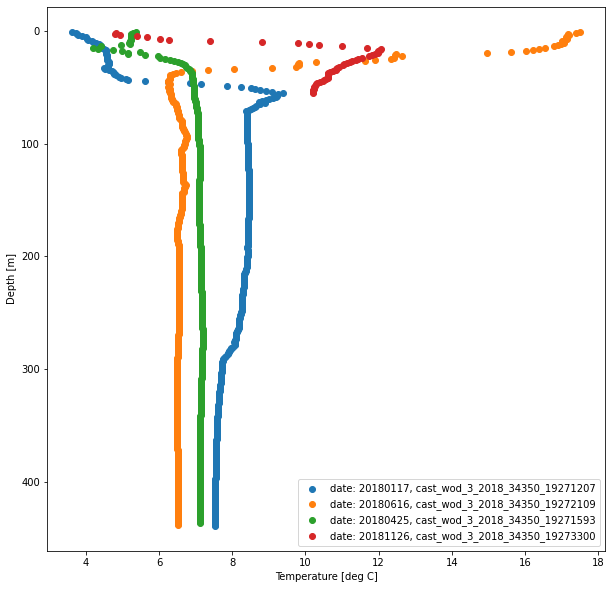

In [29]:
# Plot casts by adding the id to cast names

cast_names=['cast_wod_3_2018_34350_19271207','cast_wod_3_2018_34350_19272109','cast_wod_3_2018_34350_19271593',
           'cast_wod_3_2018_34350_19273300']

variable='Temperature'

plt.figure(figsize=(10,10))
legend=[]
for cast_name in cast_names:
    data=client.download_data_from_casts([cast_name])
    plt.scatter(data[variable],data.z)
    legend.append('date: {}, {}'.format(data.date.iloc[0],cast_name))

plt.legend(legend,loc=0)
plt.gca().invert_yaxis()   
plt.ylabel('Depth [m]')
plt.xlabel('Temperature [deg C]')
